In [1]:
import os
import string

import pandas as pd
import numpy as np
import seaborn as sns
import gensim
import nltk
import re
import matplotlib.pyplot as plt
from textblob import TextBlob

from ydata_profiling import ProfileReport
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from nltk import tokenize
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from IPython.display import Image
from spacy import displacy
from transformers import pipeline
%matplotlib inline

C:\Users\Andrii\anaconda3\envs\IASA-NLP-Homework\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\Andrii\anaconda3\envs\IASA-NLP-Homework\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit


In [2]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('brown')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!


True

In [3]:
prompts_train = pd.read_csv('./data/prompts_train.csv')
summaries_train = pd.read_csv('./data/summaries_train.csv')

prompts_test = pd.read_csv('./data/prompts_test.csv')
summaries_test = pd.read_csv('./data/summaries_test.csv')

In [4]:
prompts_train.head()

,prompt_id,prompt_question,prompt_title,prompt_text
0,39c16e,Summarize at least 3 elements of an ideal trag...,On Tragedy,Chapter 13 \r\nAs the sequel to what has alrea...
1,3b9047,"In complete sentences, summarize the structure...",Egyptian Social Structure,Egyptian society was structured like a pyramid...
2,814d6b,Summarize how the Third Wave developed over su...,The Third Wave,Background \r\nThe Third Wave experiment took ...
3,ebad26,Summarize the various ways the factory would u...,Excerpt from The Jungle,"With one member trimming beef in a cannery, an..."


In [5]:
summaries_train.head()

,student_id,prompt_id,text,content,wording
0,000e8c3c7ddb,814d6b,The third wave was an experimentto see how peo...,0.205683,0.380538
1,0020ae56ffbf,ebad26,They would rub it up with soda to make the sme...,-0.548304,0.506755
2,004e978e639e,3b9047,"In Egypt, there were many occupations and soci...",3.128928,4.231226
3,005ab0199905,3b9047,The highest class was Pharaohs these people we...,-0.210614,-0.471415
4,0070c9e7af47,814d6b,The Third Wave developed rapidly because the ...,3.272894,3.219757


In [6]:
prompts_test.head()

,prompt_id,prompt_question,prompt_title,prompt_text
0,abc123,Summarize...,Example Title 1,Heading\nText...
1,def789,Summarize...,Example Title 2,Heading\nText...


In [7]:
summaries_test.head()

,student_id,prompt_id,text
0,000000ffffff,abc123,Example text 1
1,111111eeeeee,def789,Example text 2
2,222222cccccc,abc123,Example text 3
3,333333dddddd,def789,Example text 4


In [8]:
summaries_train.prompt_id.unique()

array(['814d6b', 'ebad26', '3b9047', '39c16e'], dtype=object)

In [9]:
summaries_train.dtypes

student_id     object
prompt_id      object
text           object
content       float64
wording       float64
dtype: object

In [10]:
summaries_train.student_id.value_counts()

student_id
000e8c3c7ddb    1
a9211e196f37    1
a9ba7154832d    1
a9ba1ad23b49    1
a9b02545f465    1
               ..
54f872b66565    1
54ec1d27bae3    1
54d3b82ff5b1    1
54ce5af681b0    1
fffbccfd8a08    1
Name: count, Length: 7165, dtype: int64

In [11]:
summaries_train.shape

(7165, 5)

<h1>EDA</h1>

In [12]:
profile = ProfileReport(summaries_train, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
d = dict(list(zip(*pd.factorize(prompts_train.prompt_id)[::-1])))
def f(item):
    return d[item]

In [14]:
summaries_train['prompt_id_index'] = summaries_train['prompt_id'].transform(f)
summaries_train.head()

,student_id,prompt_id,text,content,wording,prompt_id_index
0,000e8c3c7ddb,814d6b,The third wave was an experimentto see how peo...,0.205683,0.380538,2
1,0020ae56ffbf,ebad26,They would rub it up with soda to make the sme...,-0.548304,0.506755,3
2,004e978e639e,3b9047,"In Egypt, there were many occupations and soci...",3.128928,4.231226,1
3,005ab0199905,3b9047,The highest class was Pharaohs these people we...,-0.210614,-0.471415,1
4,0070c9e7af47,814d6b,The Third Wave developed rapidly because the ...,3.272894,3.219757,2


In [15]:
prompts_train['prompt_id_index'] = prompts_train['prompt_id'].transform(f)
prompts_train.head()

,prompt_id,prompt_question,prompt_title,prompt_text,prompt_id_index
0,39c16e,Summarize at least 3 elements of an ideal trag...,On Tragedy,Chapter 13 \r\nAs the sequel to what has alrea...,0
1,3b9047,"In complete sentences, summarize the structure...",Egyptian Social Structure,Egyptian society was structured like a pyramid...,1
2,814d6b,Summarize how the Third Wave developed over su...,The Third Wave,Background \r\nThe Third Wave experiment took ...,2
3,ebad26,Summarize the various ways the factory would u...,Excerpt from The Jungle,"With one member trimming beef in a cannery, an...",3


In [16]:
train, test = train_test_split(summaries_train, test_size=0.2)

In [17]:
train.head()

,student_id,prompt_id,text,content,wording,prompt_id_index
1275,2e3fbbd64225,ebad26,There would be meat that had tumbled out on th...,-1.547163,-1.461245,3
1624,3a6b5b211b6d,39c16e,Aristotle believes that it is important that ...,0.285026,1.012890,0
1210,2baa7b36566c,ebad26,The factory would rub the meat with soda to ta...,1.499139,0.955611,3
4551,a124bc41bf76,ebad26,There would be meat that had tumbled out on th...,-1.547163,-1.461245,3
292,0b2c3f030c21,3b9047,Different social classes involved in this gove...,0.985008,0.623245,1


In [18]:
test.head()

,student_id,prompt_id,text,content,wording,prompt_id_index
3233,72bd69d180bc,39c16e,Aristotle's ideal tragedy is that in the story...,-0.810574,-1.465819,0
2018,47bbda46bab5,3b9047,The different social classes were involved ...,-0.040890,-1.629329,1
430,0ff80ff8cfe6,3b9047,In the social pyramid of ancient Egypt the pha...,0.328739,-1.053294,1
759,1b3c0f94ba98,39c16e,The three elements of an ideal tragedy would b...,0.574461,0.998748,0
254,09bae07a19b1,3b9047,The egyptian social structure was built like a...,-0.393310,0.627128,1


In [19]:
def build_world_cloud(serie):
    plt.figure(figsize=(20, 20))
    plt.title("Original Text")
    wc = WordCloud(max_words=500, width=800, height=400).generate(" ".join(serie))
    plt.imshow(wc, interpolation='bilinear')

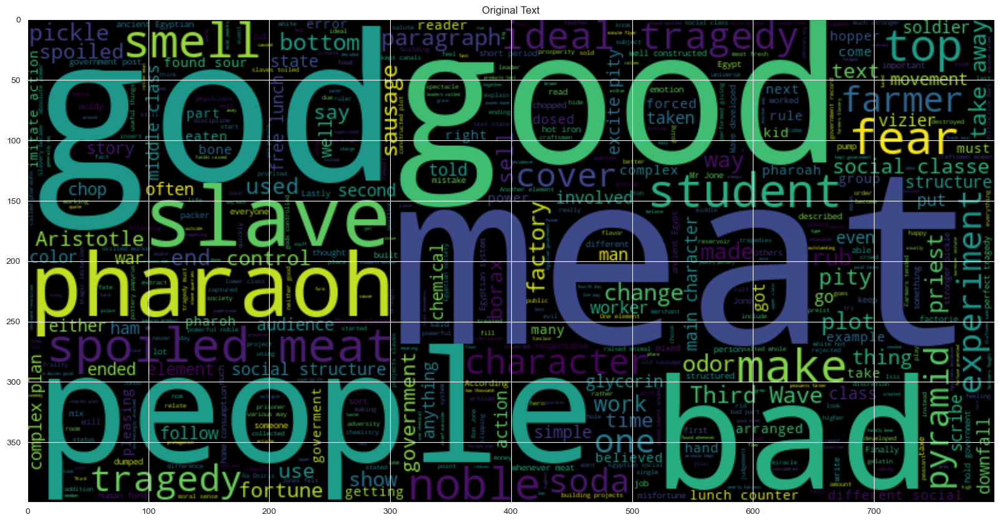

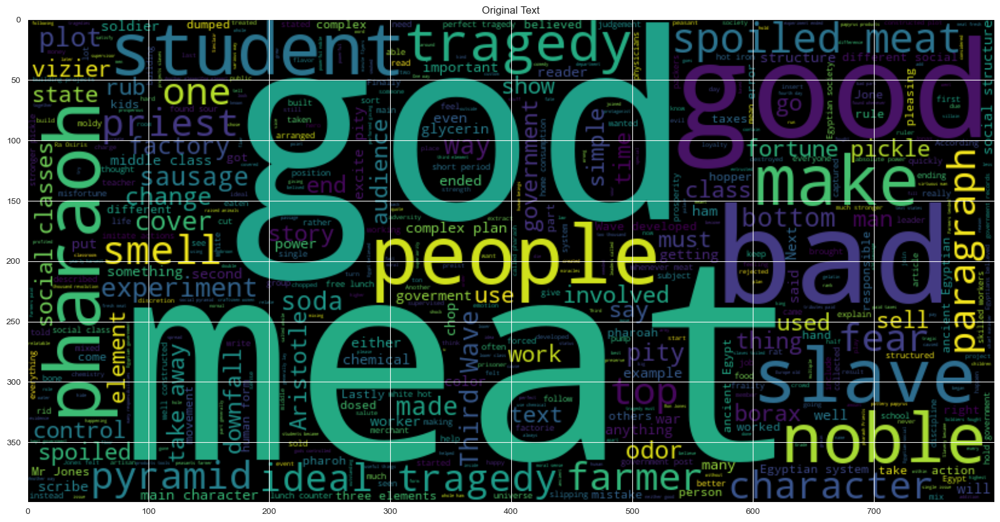

In [20]:
build_world_cloud(train['text'])
build_world_cloud(test['text'])

0    On Tragedy
Name: prompt_title, dtype: object


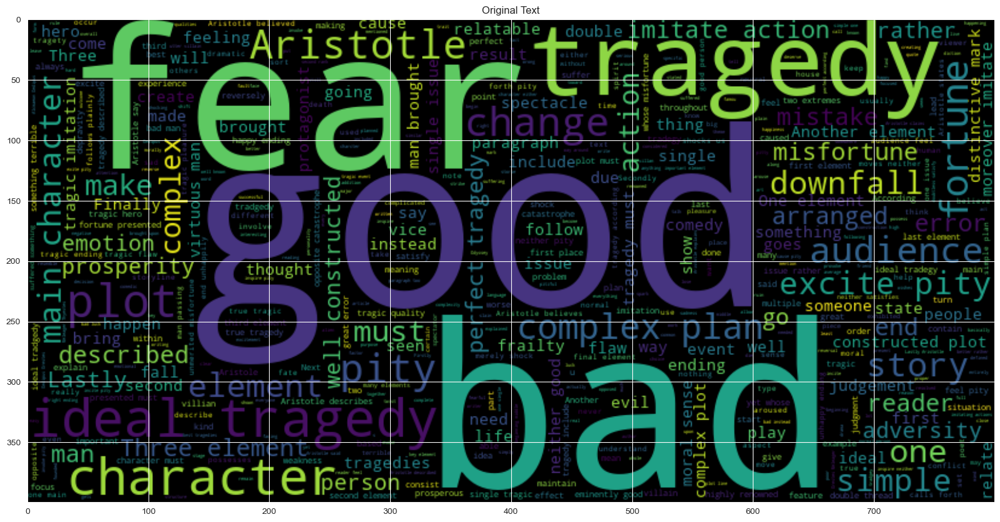

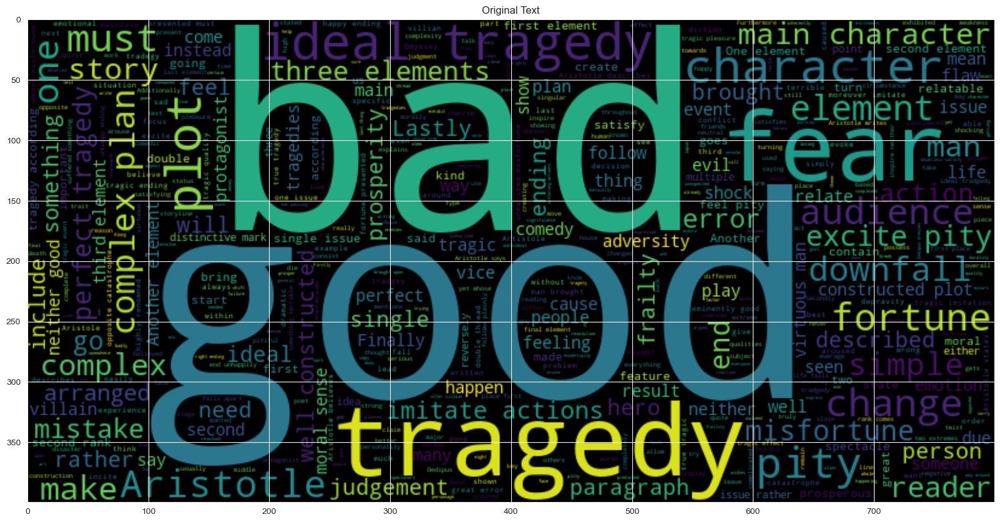

In [21]:
print(prompts_train[prompts_train['prompt_id_index'] == 0]['prompt_title'])
build_world_cloud(train[train['prompt_id_index'] == 0]['text'])
build_world_cloud(test[test['prompt_id_index'] == 0]['text'])

1    Egyptian Social Structure
Name: prompt_title, dtype: object


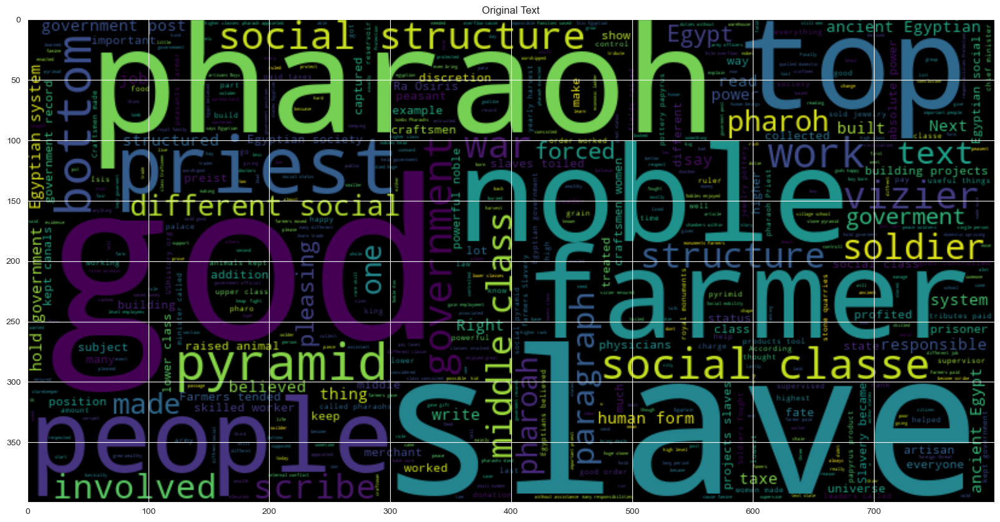

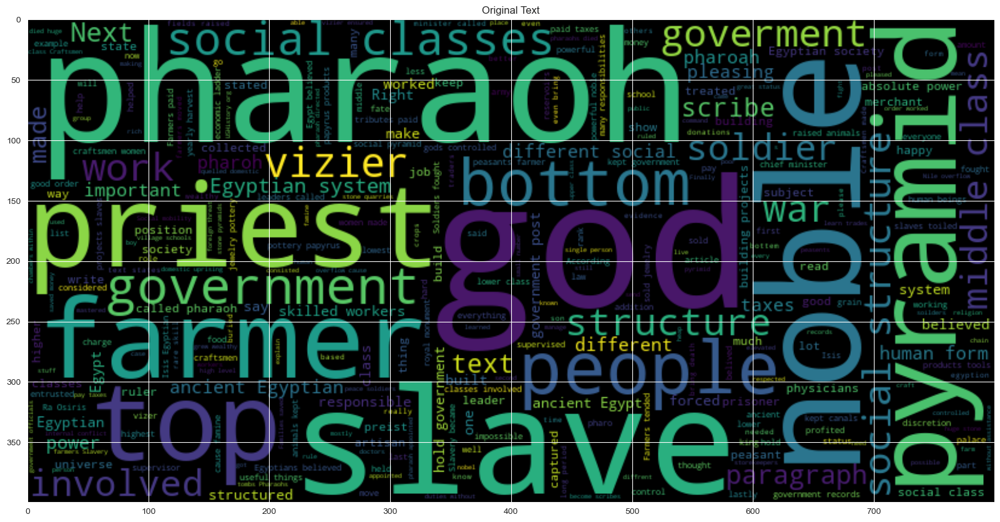

In [22]:
print(prompts_train[prompts_train['prompt_id_index'] == 1]['prompt_title'])
build_world_cloud(train[train['prompt_id_index'] == 1]['text'])
build_world_cloud(test[test['prompt_id_index'] == 1]['text'])

2    The Third Wave
Name: prompt_title, dtype: object


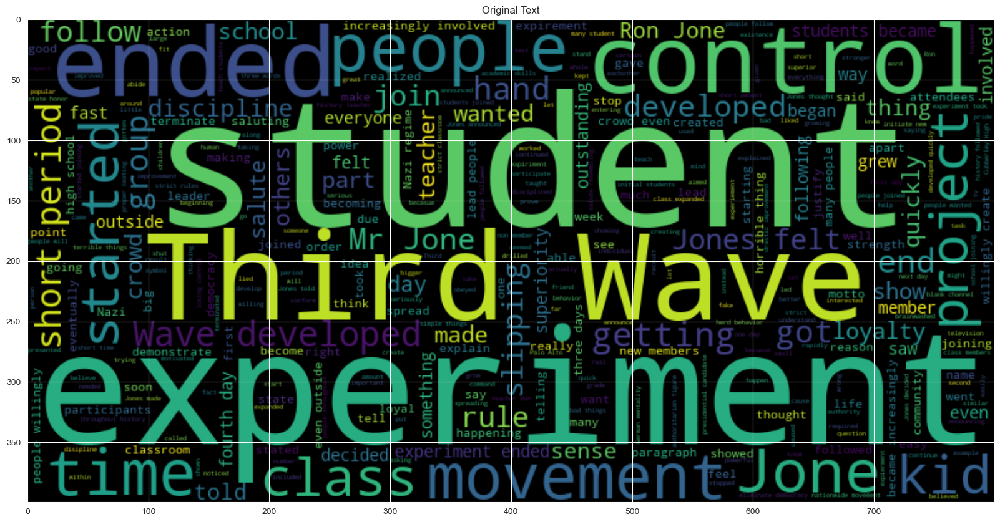

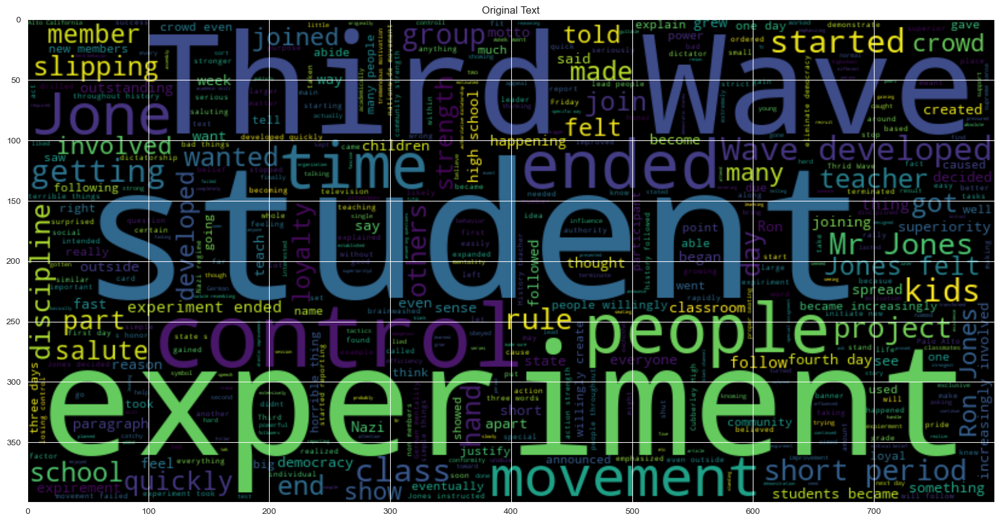

In [23]:
print(prompts_train[prompts_train['prompt_id_index'] == 2]['prompt_title'])
build_world_cloud(train[train['prompt_id_index'] == 2]['text'])
build_world_cloud(test[test['prompt_id_index'] == 2]['text'])

3    Excerpt from The Jungle
Name: prompt_title, dtype: object


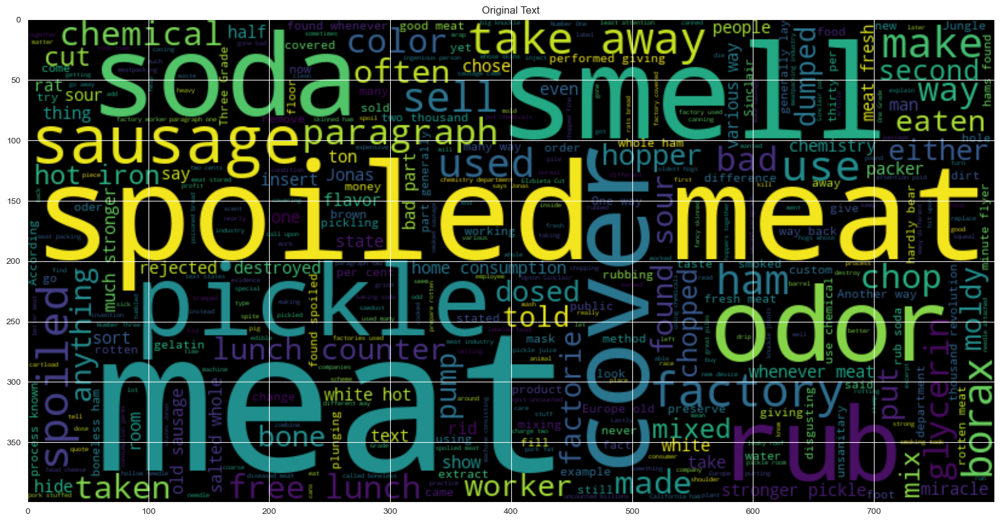

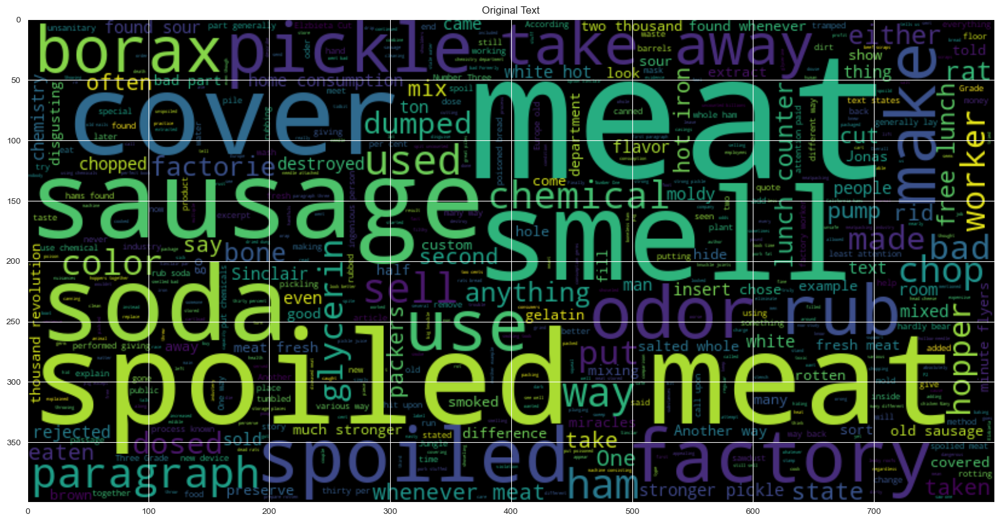

In [24]:
print(prompts_train[prompts_train['prompt_id_index'] == 3]['prompt_title'])
build_world_cloud(train[train['prompt_id_index'] == 3]['text'])
build_world_cloud(test[test['prompt_id_index'] == 3]['text'])

In [25]:
def clear_text(text, stopwords=None):
    text = text.replace('\n', '').replace('\r', '').replace('\t', '')
    text = text.lower()
    text = re.sub(r"[^\w\s']+", '', text)
    
    if stopwords is not None:            
        text = re.sub(rf'\b(?:{"|".join(stopwords)})\b', '', text)
        
    text = re.sub(rf'\s+', ' ', text)
    return text

In [26]:
def build_features(text):
    df = pd.DataFrame()
    df['text'] = text

    stop_words = stopwords.words('english')

    df['clean_text'] = df['text'].apply(clear_text) # clear all punctuation and make all to lowercase
    df['hard_clean_text'] = df['text'].apply(clear_text, args=(stop_words,)) # as previous and delete all stopwords

    df['text_blob'] = df['text'].apply(TextBlob) # make TextBlob instances for all examples

    df['words_count'] = df['text'].apply(lambda x: len(tokenize.word_tokenize(x))) # count the number of words in the sentence
    df['sentences_count'] = df['text'].apply(lambda x: len(tokenize.sent_tokenize(x))) # count the number of sentences in the sentence
    df['unique_words_count'] = df['clean_text'].apply(lambda x: len(set(tokenize.word_tokenize(x)))) # count the number of unique words in the text
    df['stopwords_count'] = df['text'].apply(lambda x: len([w for w in tokenize.word_tokenize(x) if w in stop_words]))  # count the number of stop words in the text
    df['punkt_count'] = df['text'].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))  # count the number of punctuation in the text
    df['mean_word_length'] = df['text_blob'].apply(lambda x: x.words).apply(
        lambda x: np.mean([len(word) for word in x])  # count mean length of words in the text
        )
    df['mean_sent_length'] = df['text_blob'].apply(lambda x: x.sentences).apply(
        lambda x: np.mean([len(sent.words) for sent in x])  # count mean length of sentences in the text
        )
    df['char_count'] = df['clean_text'].apply(lambda x: len(x)) # count the length of the text in chars
    # df['correct_spelling'] = df['text_blob'].apply(lambda x: x.correct()) # Work too long, but there a lot of mistakes in text, so it's expedient to correct them
    
    # building bag of words for light and hard preprocessed text
    bag_of_words = {
        'light': CountVectorizer(stop_words=[]).fit(df['clean_text']),
        'hard': CountVectorizer().fit(df['hard_clean_text'])
    }

    # building TF-IDF measure for light and hard preprocessed text
    tf_idfs = {
        'light': TfidfVectorizer(stop_words=[]).fit(df['clean_text']),
        'hard': TfidfVectorizer().fit(df['hard_clean_text'])
    }
    return df, bag_of_words, tf_idfs


In [27]:
train_features, train_bag_of_words, train_tf_idfs = build_features(train['text'])
train_features.head()

,text,clean_text,hard_clean_text,text_blob,words_count,sentences_count,unique_words_count,stopwords_count,punkt_count,mean_word_length,mean_sent_length,char_count
1275,There would be meat that had tumbled out on th...,there would be meat that had tumbled out on th...,would meat tumbled floor dirt sawdust workers...,"(T, h, e, r, e, , w, o, u, l, d, , b, e, , ...",64,3,40,26,7,4.333333,19.000000,304
1624,Aristotle believes that it is important that ...,aristotle believes that it is important that t...,aristotle believes important main character go...,"(A, r, i, s, t, o, t, l, e, , b, e, l, i, e, ...",87,3,54,43,7,4.062500,26.666667,404
1210,The factory would rub the meat with soda to ta...,the factory would rub the meat with soda to ta...,factory would rub meat soda take away smell s...,"(T, h, e, , f, a, c, t, o, r, y, , w, o, u, ...",240,7,109,101,30,4.069444,30.857143,1093
4551,There would be meat that had tumbled out on th...,there would be meat that had tumbled out on th...,would meat tumbled floor dirt sawdust workers...,"(T, h, e, r, e, , w, o, u, l, d, , b, e, , ...",34,1,26,16,3,4.483871,31.000000,169
292,Different social classes involved in this gove...,different social classes involved in this gove...,different social classes involved government 3...,"(D, i, f, f, e, r, e, n, t, , s, o, c, i, a, ...",178,8,86,75,15,4.654545,20.625000,931


In [28]:
test_features, test_bag_of_words, teset_tf_idfs = build_features(test['text'])
test_features.head()

,text,clean_text,hard_clean_text,text_blob,words_count,sentences_count,unique_words_count,stopwords_count,punkt_count,mean_word_length,mean_sent_length,char_count
3233,Aristotle's ideal tragedy is that in the story...,aristotle's ideal tragedy is that in the story...,aristotle' ideal tragedy story mood fell like ...,"(A, r, i, s, t, o, t, l, e, ', s, , i, d, e, ...",51,1,34,22,5,4.297872,47.00,247
2018,The different social classes were involved ...,the different social classes were involved in...,different social classes involved goverment p...,"( , , , T, h, e, , d, i, f, f, e, r, e, n, ...",52,1,35,23,5,5.297872,47.00,296
430,In the social pyramid of ancient Egypt the pha...,in the social pyramid of ancient egypt the pha...,social pyramid ancient egypt pharaohs associa...,"(I, n, , t, h, e, , s, o, c, i, a, l, , p, ...",53,2,37,19,6,5.276596,23.50,294
759,The three elements of an ideal tragedy would b...,the three elements of an ideal tragedy would b...,three elements ideal tragedy would complex pl...,"(T, h, e, , t, h, r, e, e, , e, l, e, m, e, ...",114,4,65,44,9,4.542857,26.25,581
254,The egyptian social structure was built like a...,the egyptian social structure was built like a...,egyptian social structure built like pyramid ...,"(T, h, e, , e, g, y, p, t, i, a, n, , s, o, ...",59,4,37,19,11,4.562500,12.00,266


In [29]:
corr = pd.concat([train_features.iloc[:, 4:], train[['content', 'wording']]], axis=1).corr()

<Axes: >

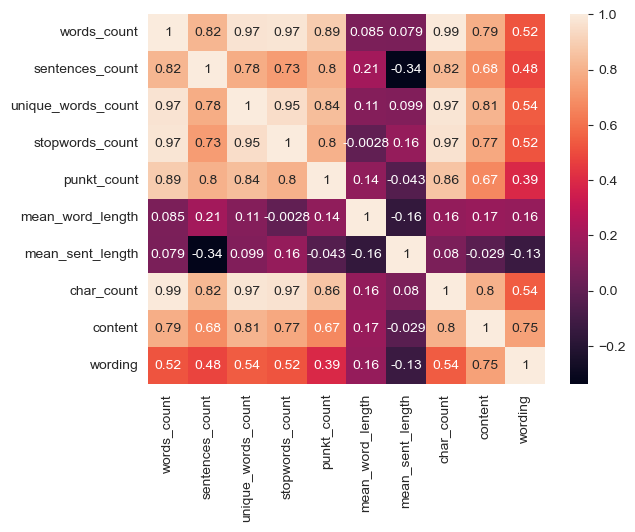

In [30]:
sns.heatmap(corr, annot=True)

In [31]:
model = LinearRegression()
model = model.fit(
    train_features.iloc[:, 4:],
    train[['content', 'wording']])
model.score(
    train_features.iloc[:, 4:],
    train[['content', 'wording']])

0.526623337072062

In [32]:
model2 = LinearRegression()
X, y = train_bag_of_words['light'].transform(train_features['clean_text']), train[['content', 'wording']]
model2 = model2.fit(X, y)
model2.score(X, y)

0.9990908897411557